In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re
from wordcloud import WordCloud

In [ ]:
#Karthik Vempati|19BCE1272
#Nagireddi Uday | 19BCE1317
#Kundeti Pavan Kumar | 19BCE1821
#Paturi Siva Sathvik|19BCE1587

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Embedding,LSTM,Conv1D,MaxPool1D
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,accuracy_score

In [ ]:
#Sequences for feedinding layers like dense embedding etc

#Exploring Fake news

In [ ]:
pd.read_csv('Fake.csv')

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"
...,...,...,...,...
23476,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,"January 16, 2016"
23477,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,"January 16, 2016"
23478,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,"January 15, 2016"
23479,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,"January 14, 2016"


In [ ]:
fake=pd.read_csv('Fake.csv')

In [ ]:
fake.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [ ]:
fake.columns

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [ ]:
fake['subject'].value_counts()

News               9050
politics           6841
left-news          4459
Government News    1570
US_News             783
Middle-east         778
Name: subject, dtype: int64

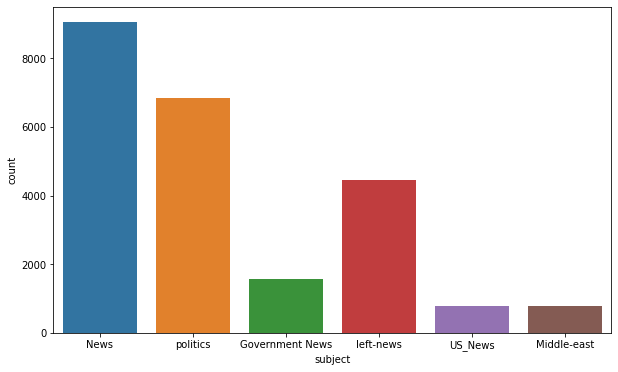

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(x='subject',data=fake)

In [ ]:
#Visualsing text data word cloud before that mix all the data together

Word cloud

In [ ]:
fake['text'].tolist() #series to list

['Donald Trump just couldn t wish all Americans a Happy New Year and leave it at that. Instead, he had to give a shout out to his enemies, haters and  the very dishonest fake news media.  The former reality show star had just one job to do and he couldn t do it. As our Country rapidly grows stronger and smarter, I want to wish all of my friends, supporters, enemies, haters, and even the very dishonest Fake News Media, a Happy and Healthy New Year,  President Angry Pants tweeted.  2018 will be a great year for America! As our Country rapidly grows stronger and smarter, I want to wish all of my friends, supporters, enemies, haters, and even the very dishonest Fake News Media, a Happy and Healthy New Year. 2018 will be a great year for America!  Donald J. Trump (@realDonaldTrump) December 31, 2017Trump s tweet went down about as welll as you d expect.What kind of president sends a New Year s greeting like this despicable, petty, infantile gibberish? Only Trump! His lack of decency won t e

In [ ]:
#Coverted to list from series

In [ ]:
text=' '.join(fake['text'].tolist())

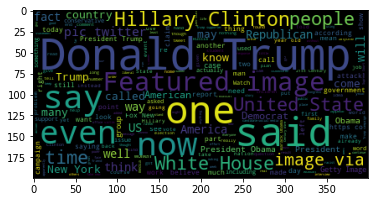

In [ ]:
wordcloud=WordCloud().generate(text)
plt.imshow(wordcloud)

Explore real news dataset

In [ ]:
real=pd.read_csv('True.csv')

In [ ]:
text=' '.join(real['text'].tolist())

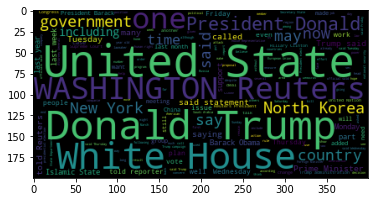

In [ ]:
wordcloud=WordCloud().generate(text)
plt.imshow(wordcloud)

In [ ]:
#Main difference is washigton reuters here is here but not in fakr

In [ ]:
#Cleaning data

In [ ]:
real.sample(5)

,title,text,subject,date
19660,Turkish warplanes kill three Kurdish militants...,ANKARA (Reuters) - Turkish warplanes struck Ku...,worldnews,"September 19, 2017"
15163,U.N. urges calm as deadline nears for asylum s...,SYDNEY (Reuters) - About 20 asylum seekers on ...,worldnews,"November 10, 2017"
19154,Myanmar says bodies of 28 Hindu villagers foun...,YANGON (Reuters) - Myanmar government forces f...,worldnews,"September 24, 2017"
15000,Telefonica suspends customer service operation...,GUATEMALA CITY (Reuters) - The Guatemalan unit...,worldnews,"November 13, 2017"
9875,"U.S., Iran discuss fulfilling nuclear deal ple...",UNITED NATIONS (Reuters) - U.S. Secretary of S...,politicsNews,"April 19, 2016"


In [ ]:
unknown_publishers=[]
for index,row in enumerate(real.text.values):
  try:
    record=row.split('-',maxsplit=1)
    record[1]
    #twwets data less than 260 chars generally lets check
    assert(len(record[0])<120)
  except:
    unknown_publishers.append(index)


In [ ]:
len(unknown_publishers) #unknown publlishers

222

In [ ]:
real.iloc[unknown_publishers].text

7        The following statements were posted to the ve...
8        The following statements were posted to the ve...
12       The following statements were posted to the ve...
13       The following statements were posted to the ve...
14        (In Dec. 25 story, in second paragraph, corre...
                               ...                        
20135     (Story corrects to million from billion in pa...
20500     (This Sept 8 story corrects headline, clarifi...
20667     (Story refiles to add dropped word  not , in ...
21246     (Story corrects third paragraph to show Mosul...
21339     (Story corrects to fix spelling in paragraph ...
Name: text, Length: 222, dtype: object

drop empty row

In [ ]:
real.iloc[8970]

title      Graphic: Supreme Court roundup
text                                     
subject                      politicsNews
date                       June 16, 2016 
Name: 8970, dtype: object

In [ ]:
real=real.drop(8970,axis=0) #drop from row

In [ ]:
publisher=[]
tmp_text=[]

for index,row in enumerate(real.text.values):
  if index in unknown_publishers:
    tmp_text.append(row)
    publisher.append('Unknown')
  else:
    record=row.split('-',maxsplit=1)
    publisher.append(record[0].strip())
    tmp_text.append(record[1].strip())



In [ ]:
#as tweets dont have publishers

In [ ]:
real['publisher']=publisher
real['text']=tmp_text

In [ ]:
real.head()

,title,text,subject,date,publisher
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction ...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fir...,politicsNews,"December 29, 2017",WASHINGTON (Reuters)
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links bet...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos tol...,politicsNews,"December 30, 2017",WASHINGTON (Reuters)
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Post...,politicsNews,"December 29, 2017",SEATTLE/WASHINGTON (Reuters)


In [ ]:
real.shape

(21416, 5)

In [ ]:
empty_fake_index=[index for index,text in enumerate(fake.text.tolist()) if str(text).strip()==""]

In [ ]:
fake.iloc[empty_fake_index]

,title,text,subject,date
10923,TAKE OUR POLL: Who Do You Think President Trum...,,politics,"May 10, 2017"
11041,Joe Scarborough BERATES Mika Brzezinski Over “...,,politics,"Apr 26, 2017"
11190,WATCH TUCKER CARLSON Scorch Sanctuary City May...,,politics,"Apr 6, 2017"
11225,MAYOR OF SANCTUARY CITY: Trump Trying To Make ...,,politics,"Apr 2, 2017"
11236,SHOCKER: Public School Turns Computer Lab Into...,,politics,"Apr 1, 2017"
...,...,...,...,...
21816,BALTIMORE BURNS: MARYLAND GOVERNOR BRINGS IN N...,,left-news,"Apr 27, 2015"
21826,FULL VIDEO: THE BLOCKBUSTER INVESTIGATION INTO...,,left-news,"Apr 25, 2015"
21827,(VIDEO) HILLARY CLINTON: RELIGIOUS BELIEFS MUS...,,left-news,"Apr 25, 2015"
21857,(VIDEO)ICE PROTECTING OBAMA: WON’T RELEASE NAM...,,left-news,"Apr 14, 2015"


In [ ]:
#Remove these empty texts

In [ ]:
real['text']=real['title']+" "+real['text']
fake['text']=fake['title']+" "+fake['text']

In [ ]:
real['text']=real['text'].apply(lambda x: str(x).lower())
fake['text']=fake['text'].apply(lambda x: str(x).lower())

#Preprocessing text

In [ ]:
real['class']=1
fake['class']=0

In [ ]:
real.columns

Index(['title', 'text', 'subject', 'date', 'publisher', 'class'], dtype='object')

In [ ]:
#only text and class are required

In [ ]:
real=real[['text','class']]


In [ ]:
fake=fake[['text','class']]

In [ ]:
data=real.append(fake,ignore_index=True)

In [ ]:
data.sample(5)

,text,class
5812,factbox: trump u.s. supreme court pick could a...,1
16543,uk parliament vote on brexit deal may come aft...,1
23776,jon stewart brilliantly reveals trump’s major...,0
44861,glossed over: key questions emerge after death...,0
25028,trump’s possible dhs pick threatened to destr...,0


In [ ]:
!pip install spacy==2.2.3
!python -m spacy download en_core_web_sm
!pip install beautifulsoup4==4.9.1
!pip install textblob==0.15.3
!pip install git+https://github.com/laxmimerit/preprocess_kgptalkie.git --upgrade --force-reinstall

     |████████████████████████████████| 10.4 MB 4.4 MB/s 
     |████████████████████████████████| 2.2 MB 39.3 MB/s 
  Attempting uninstall: thinc
    Found existing installation: thinc 7.4.0
    Uninstalling thinc-7.4.0:
      Successfully uninstalled thinc-7.4.0
  Attempting uninstall: spacy
    Found existing installation: spacy 2.2.4
    Uninstalling spacy-2.2.4:
      Successfully uninstalled spacy-2.2.4
     |████████████████████████████████| 12.0 MB 4.3 MB/s 
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
     |████████████████████████████████| 115 kB 4.3 MB/s 
  Attempting uninstall: beautifulsoup4
    Found existing installation: beautifulsoup4 4.6.3
    Uninstalling beautifulsoup4-4.6.3:
      Successfully uninstalled beautifulsoup4-4.6.3
  Cloning https://github.com/laxmimerit/preprocess_kgptalkie.git to /tmp/pip-req-build-tdvlikp0
  Running command git clone -q https://github.com/laxmimerit/preprocess_kgptalkie.git /tmp/pip

In [ ]:
import preprocess_kgptalkie as ps


In [ ]:
data['text']=data['text'].apply(lambda x: ps.remove_special_chars(x))

In [ ]:
#all special characters removed

In [ ]:
data.head()

,text,class
0,as us budget fight looms republicans flip thei...,1
1,us military to accept transgender recruits on ...,1
2,senior us republican senator let mr mueller do...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge much more...,1


#VECTORISATION

In [ ]:
#Word 2 vec if we feed a word sequence of vectors generated

In [ ]:
#dimensions can be choosed

In [ ]:
import gensim

In [ ]:
y=data['class'].values

In [ ]:
X=[d.split() for d in data['text'].tolist()]

In [ ]:
#list of lists conversion

In [ ]:
print(X[0])

['as', 'us', 'budget', 'fight', 'looms', 'republicans', 'flip', 'their', 'fiscal', 'script', 'the', 'head', 'of', 'a', 'conservative', 'republican', 'faction', 'in', 'the', 'us', 'congress', 'who', 'voted', 'this', 'month', 'for', 'a', 'huge', 'expansion', 'of', 'the', 'national', 'debt', 'to', 'pay', 'for', 'tax', 'cuts', 'called', 'himself', 'a', 'fiscal', 'conservative', 'on', 'sunday', 'and', 'urged', 'budget', 'restraint', 'in', '2018', 'in', 'keeping', 'with', 'a', 'sharp', 'pivot', 'under', 'way', 'among', 'republicans', 'us', 'representative', 'mark', 'meadows', 'speaking', 'on', 'cbs', 'face', 'the', 'nation', 'drew', 'a', 'hard', 'line', 'on', 'federal', 'spending', 'which', 'lawmakers', 'are', 'bracing', 'to', 'do', 'battle', 'over', 'in', 'january', 'when', 'they', 'return', 'from', 'the', 'holidays', 'on', 'wednesday', 'lawmakers', 'will', 'begin', 'trying', 'to', 'pass', 'a', 'federal', 'budget', 'in', 'a', 'fight', 'likely', 'to', 'be', 'linked', 'to', 'other', 'issues',

In [ ]:
#100 dim vector using here

In [ ]:
DIM=100
w2v_model=gensim.models.Word2Vec(sentences=X,size=DIM,window=10,min_count=1)

In [ ]:
len(w2v_model.wv.vocab) #total vectors for unique words

231872

In [ ]:
#Get vectors for a word

In [ ]:
w2v_model.wv['india']

array([ 1.058683  , -2.604915  , -0.9805569 , -3.3043294 , -2.4431207 ,
       -2.880794  , -3.7228053 , -2.194174  , -0.25738332,  1.1502855 ,
       -0.8125694 , -0.3489315 , -0.47151768,  2.0882027 ,  0.3593478 ,
        0.8358396 , -2.4104168 , -2.563915  , -2.075184  ,  1.9356145 ,
       -1.0755595 ,  3.1353772 ,  0.903595  , -0.3988877 , -0.3310438 ,
        2.9986575 ,  2.031844  , -0.83026284, -0.01808544, -2.2124305 ,
        0.15634304,  1.0810964 ,  2.0699906 , -0.19824457,  1.0210333 ,
       -1.3264419 ,  0.84028435,  1.1328743 , -0.8582363 ,  1.0797896 ,
        0.58305305,  3.7305498 , -0.7811294 ,  0.5360639 , -3.9482555 ,
       -1.8663553 ,  1.4202743 ,  0.52788013, -0.6007077 ,  0.9911604 ,
        0.04299494, -2.098667  , -0.43748462, -0.9560767 , -2.0687227 ,
       -1.31428   , -0.6159235 ,  0.01626774,  2.5782888 , -0.19878389,
        0.39080688,  0.33142784,  0.53884983, -2.276155  , -1.167355  ,
        0.32633162, -1.1895726 ,  0.38458574, -1.6451907 , -1.81

In [ ]:
w2v_model.wv.most_similar('india')

[('pakistan', 0.7330728769302368),
 ('malaysia', 0.6943868398666382),
 ('china', 0.6761833429336548),
 ('beijings', 0.6573926210403442),
 ('indias', 0.6315364837646484),
 ('thailand', 0.6296396255493164),
 ('norway', 0.6199870705604553),
 ('australia', 0.6189331412315369),
 ('modi', 0.6153987050056458),
 ('senegal', 0.6110597252845764)]

In [ ]:
#Now set of vectors are redy

In [ ]:
tokenizer=Tokenizer()
tokenizer.fit_on_texts(X)

In [ ]:
#NOW X IS SET OF SEQUENCES

In [ ]:
X = tokenizer.texts_to_sequences(X)

In [ ]:
X

[[18,
  30,
  473,
  480,
  10668,
  133,
  8088,
  40,
  1375,
  5171,
  1,
  419,
  3,
  4,
  301,
  79,
  6312,
  6,
  1,
  30,
  189,
  29,
  773,
  26,
  279,
  9,
  4,
  1107,
  2956,
  3,
  1,
  124,
  954,
  2,
  447,
  9,
  184,
  1193,
  173,
  393,
  4,
  1375,
  301,
  8,
  342,
  5,
  1110,
  473,
  7805,
  6,
  1188,
  6,
  1764,
  16,
  4,
  3407,
  7895,
  141,
  164,
  320,
  133,
  30,
  798,
  922,
  7806,
  675,
  8,
  2010,
  476,
  1,
  383,
  1761,
  4,
  559,
  589,
  8,
  168,
  691,
  50,
  408,
  28,
  17340,
  2,
  89,
  1352,
  65,
  6,
  410,
  60,
  32,
  776,
  25,
  1,
  8089,
  8,
  203,
  408,
  39,
  1438,
  350,
  2,
  929,
  4,
  168,
  473,
  6,
  4,
  480,
  304,
  2,
  22,
  1957,
  2,
  80,
  426,
  170,
  18,
  312,
  208,
  107,
  18,
  1,
  515,
  570,
  96,
  1781,
  1504,
  6,
  50,
  133,
  39,
  1072,
  2,
  377,
  349,
  3,
  189,
  37,
  68,
  14,
  5,
  19,
  133,
  182,
  4,
  379,
  473,
  959,
  6,
  169,
  691,
  110,
  196,
  62,

In [ ]:
#For a particular word a sequence number is assigned

In [ ]:
tokenizer.word_index

{'the': 1,
 'to': 2,
 'of': 3,
 'a': 4,
 'and': 5,
 'in': 6,
 'that': 7,
 'on': 8,
 'for': 9,
 's': 10,
 'is': 11,
 'he': 12,
 'said': 13,
 'trump': 14,
 'it': 15,
 'with': 16,
 'was': 17,
 'as': 18,
 'his': 19,
 'by': 20,
 'has': 21,
 'be': 22,
 'have': 23,
 'not': 24,
 'from': 25,
 'this': 26,
 'at': 27,
 'are': 28,
 'who': 29,
 'us': 30,
 'an': 31,
 'they': 32,
 'i': 33,
 'but': 34,
 'we': 35,
 'would': 36,
 'president': 37,
 'about': 38,
 'will': 39,
 'their': 40,
 'had': 41,
 'you': 42,
 't': 43,
 'been': 44,
 'were': 45,
 'people': 46,
 'more': 47,
 'or': 48,
 'after': 49,
 'which': 50,
 'she': 51,
 'her': 52,
 'one': 53,
 'if': 54,
 'its': 55,
 'out': 56,
 'all': 57,
 'what': 58,
 'state': 59,
 'when': 60,
 'new': 61,
 'also': 62,
 'up': 63,
 'there': 64,
 'over': 65,
 'no': 66,
 'house': 67,
 'donald': 68,
 'our': 69,
 'states': 70,
 'clinton': 71,
 'obama': 72,
 'government': 73,
 'can': 74,
 'just': 75,
 'him': 76,
 'so': 77,
 'than': 78,
 'republican': 79,
 'other': 80,
 'so

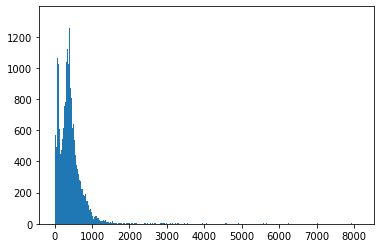

In [ ]:
plt.hist([len(x) for x in X],bins=700)
plt.show() #words less than 1000

In [ ]:
#so we can truncate those more than 1000 words

In [ ]:
nos=np.array([len(x) for x in X])
len(nos[nos>1000])

1581

In [ ]:
maxlen=1000 #When a sequence i greater than 1000 truncate else add 0 padd 0
X=pad_sequences(X,maxlen=maxlen)

In [ ]:
vocab_size=len(tokenizer.word_index)+1

In [ ]:
vocab=tokenizer.word_index

In [ ]:
def get_weight_matrix(model):
  weight_matrix=np.zeros((vocab_size,DIM))

  for word,i in vocab.items():
    weight_matrix[i]=model.wv[word]


  return weight_matrix



In [ ]:
embedding_vectors=get_weight_matrix(w2v_model)

In [ ]:
embedding_vectors.shape

(231873, 100)

#Going for model

In [ ]:
model=Sequential()
model.add(Embedding(vocab_size,output_dim=DIM,weights=[embedding_vectors],input_length=maxlen,trainable=False))
model.add(LSTM(units=128))
model.add(Dense(1,activation='sigmoid')) #as a biclass problem
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['acc'])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 1000, 100)         23187300  
                                                                 
 lstm (LSTM)                 (None, 128)               117248    
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 23,304,677
Trainable params: 117,377
Non-trainable params: 23,187,300
_________________________________________________________________


In [ ]:
#pretrained weights from word 2 vec

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(X,y)

In [ ]:
model.fit(X_train,y_train,validation_split=0.3,epochs=6)

Epoch 1/6
737/737 [==============================] - 128s 165ms/step - loss: 0.1480 - acc: 0.9472 - val_loss: 0.0531 - val_acc: 0.9831
Epoch 2/6
737/737 [==============================] - 121s 165ms/step - loss: 0.0483 - acc: 0.9832 - val_loss: 0.0465 - val_acc: 0.9826
Epoch 3/6
737/737 [==============================] - 121s 165ms/step - loss: 0.0266 - acc: 0.9918 - val_loss: 0.0496 - val_acc: 0.9848
Epoch 4/6
737/737 [==============================] - 127s 172ms/step - loss: 0.0255 - acc: 0.9920 - val_loss: 0.0290 - val_acc: 0.9916
Epoch 5/6
737/737 [==============================] - 122s 165ms/step - loss: 0.0116 - acc: 0.9964 - val_loss: 0.0267 - val_acc: 0.9922
Epoch 6/6
737/737 [==============================] - 122s 165ms/step - loss: 0.0138 - acc: 0.9955 - val_loss: 0.0284 - val_acc: 0.9909


In [ ]:
#training is done

In [ ]:
#Check accuracy for test dataset

In [ ]:
y_pred=(model.predict(X_test) >=0.5).astype(int)

In [ ]:
accuracy_score(y_test,y_pred)

0.9931403118040089

In [ ]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      5856
           1       0.99      0.99      0.99      5369

    accuracy                           0.99     11225
   macro avg       0.99      0.99      0.99     11225
weighted avg       0.99      0.99      0.99     11225



In [ ]:
#Check whether a line is true or false

In [ ]:
x=['this is a news']
x=tokenizer.texts_to_sequences(x)
x=pad_sequences(x,maxlen=maxlen)
(model.predict(x)>=0.5).astype(int)
#0 means its a fake nws


array([[0]])

In [ ]:
x=['Delhi recorded 299 fresh cases of COVID-19 on Wednesday - a rise of nearly 50 percent since yesterday (202). With this, the national capitals caseload has increased to 18,66,881']
x=tokenizer.texts_to_sequences(x)
x=pad_sequences(x,maxlen=maxlen)
(model.predict(x)>=0.5).astype(int)
#as 1 is output it is a real news

array([[1]])

In [ ]:
x=['Facebooks 2 billion-plus users also had access to a post claiming that Rep. Alexandria Ocasio-Cortez proposed a ban on motorcycles ']
x=tokenizer.texts_to_sequences(x)
x=pad_sequences(x,maxlen=maxlen)
(model.predict(x)>=0.5).astype(int)

array([[1]])

In [ ]:
x=['Facebook is making a change related to ownership of users information or the content they post to the site. ']
x=tokenizer.texts_to_sequences(x)
x=pad_sequences(x,maxlen=maxlen)
(model.predict(x)>=0.5).astype(int)

array([[1]])

In [ ]:
x=['21st Century Wire says This week, the historic international Iranian Nuclear Deal was punctuated by a two-way prisoner swap between Washington and Tehran, but it didn t end quite the way everyone expected. On the Iranian side, one of the U.S. citizens who was detained in Iran, Nosratollah Khosravi-Roodsari, has stayed in Iran, but on the U.S. side   all 7 of the Iranians held in U.S. prisons DID NOT show up to their flight to Geneva for the prisoner exchange   with at least 3 electing to stay in the U.S  TEHRAN SIDE: In Iran, 5 U.S. prisoners were released, with 4 of them making their way to Germany via Switzerland.Will Robinson Daily MailNone of the Iranians freed in the prisoner swap have returned home and could still be in the United States, it has been reported.The seven former inmates, who were released as part of a deal with the Islamic republic, did not show up to get a flight to Geneva, Switzerland, where the exchange was set to take place on Sunday.Three of the Iranians have decided to stay in the United States, ABC reported, with some moving in with their families. However it is not known where the other four are.Three of the Americans who had been detained in Iran   Washington Post journalist Jason Rezaian, former U.S. Marine Amir Hekmati and Christian pastor Saeed Abedini   left Tehran at around 7am the same day, but weren t met by their counterparts in Switzerland Continue this story at the Mail OnlineREAD MORE IRAN NEWS AT: 21st Century Wire Iran Files']
x=tokenizer.texts_to_sequences(x)
x=pad_sequences(x,maxlen=maxlen)
(model.predict(x)>=0.5).astype(int)
#It is a fake news so 0

array([[0]])

In [ ]:
x=['Paul Craig RobertsIn the last years of the 20th century fraud entered US foreign policy in a new way.  On false pretenses Washington dismantled Yugoslavia and Serbia in order to advance an undeclared agenda. In the 21st century this fraud multiplied many times. Afghanistan, Iraq, Somalia, and Libya were destroyed, and Iran and Syria would also have been destroyed if the President of Russia had not prevented it.  Washington is also behind the current destruction of Yemen, and Washington has enabled and financed the Israeli destruction of Palestine.  Additionally, Washington operated militarily within Pakistan without declaring war, murdering many women, children, and village elders under the guise of  combating terrorism.  Washington s war crimes rival those of any country in history.I have documented these crimes in my columns and books (Clarity Press). Anyone who still believes in the purity of Washington s foreign policy is a lost soul  Russia and China now have a strategic alliance that is too strong for Washington. Russia and China will prevent Washington from further encroachments on their security and national interests. Those countries important to Russia and China will be protected by the alliance.  As the world wakes up and sees the evil that the West represents, more countries will seek the protection of Russia and China.America is also failing on the economic front.  My columns and my book, The Failure of Laissez Faire Capitalism, which has been published in English, Chinese, Korean, Czech, and German, have shown how Washington has stood aside, indeed cheering it on, while the short-term profit interests of management, shareholders, and Wall Street eviscerated the American economy, sending manufacturing jobs, business know-how, and technology, along with professional tradeable skill jobs, to China, India, and other countries, leaving America with such a hollowed out economy that the median family income has been falling for years. Today 50% of 25 year-old Americans are living with their parents or grandparents because they cannot find employment sufficient to sustain an independent existance.This brutal fact is covered up by the presstitute US media, a source of fantasy stories of America s economic recovery.The facts of our existence are so different from what is reported that I am astonished. As a former professor of economics, Wall Street Journal editor and Assistant Secretary of the Treasury for Economic Policy, I am astonished at the corruption that rules in the financial sector, the Treasury, the financial regulatory agencies, and the Federal Reserve.  In my day, there would have been indictments and prison sentences of bankers and high government officials.In America today there are no free financial markets.  All the markets are rigged by the Federal Reserve and the Treasury. The regulatory agencies, controlled by those the agencies are supposed to regulate, turn a blind eye, and even if they did not, they are helpless to enforce any law, because private interests are more powerful than the law.Even the government s statistical agencies have been corrupted. Inflation measures have been concocted in order to understate inflation. This lie not only saves Washington from paying Social Security cost-of-living adjustments and frees the money for more wars, but also by understating inflation, the government can create real GDP growth by counting inflation as real growth, just as the government creates 5% unemployment by not counting any discouraged workers who have looked for jobs until they can no longer afford the cost of looking and give up.  The official unemployment rate is 5%, but no one can find a job.  How can the unemployment rate be 5% when half of 25-year olds are living with relatives because they cannot afford an independent existence?  As John Williams (shadowfacts) reports, the unemployment rate that includes those Americans who have given up looking for a job because there are no jobs to be found is 23%.The Federal Reserve, a tool of a small handful of banks, has succeeded in creating the illusion of an economic recovery since June, 2009, by printing trillions of dollars that found their way not into the economy but into the prices of financial assets.  Artificially booming stock and bond markets are the presstitute financial media s  proof  of a booming economy.The handful of learned people that America has left, and it is only a small handful, understand that there has been no recovery from the previous recession and that a new downturn is upon us.  John Williams has pointed out that US industrial production, when properly adjusted for inflation, has never recovered its 2008 level, much less its 2000 peak, and has again turned down.The American consumer is exhausted, overwhelmed by debt and lack of income growth. The entire economic policy of America is focused on saving a handful of NY banks, not on saving the American economy.Economists and other Wall Street shills will dismiss the decline in industrial production as America is now a service economy. Economists pretend that these are high-tech services of the New Economy, but in fact waitresses, bartenders, part time retail clerks, and ambulatory health care services have replaced manufacturing and engineering jobs at a fraction of the pay, thus collapsing effective aggregate demand in the US. On occasions when neoliberal economists recognize problems, they blame them on China.It is unclear that the US economy can be revived. To revive the US economy would require the re-regulation of the financial system and the recall of the jobs and US GDP that offshoring gave to foreign countries. It would require, as Michael Hudson demonstrates in his new book, Killing the Host, a revolution in tax policy that would prevent the financial sector from extracting economic surplus and capitalizing it in debt obligations paying interest to the financial sector.The US government, controlled as it is by corrupt economic interests, would never permit policies that impinged on executive bonuses and Wall Street profits.  Today US capitalism makes its money by selling out the American economy and the people dependent upon it.In  freedom and democracy  America, the government and the economy serve interests totally removed from the interests of the American people. The sellout of the American people is protected by a huge canopy of propaganda provided by free market economists and financial presstitutes paid to lie for their living.When America fails, so will Washington s vassal states in Europe, Canada, Australia, and Japan.  Unless Washington destroys the world in nuclear war, the world will be remade, and the corrupt and dissolute West will be an insignificant part of the new world.Dr. Paul Craig Roberts was Assistant Secretary of the Treasury for Economic Policy and associate editor of the Wall Street Journal. He was columnist for Business Week, Scripps Howard News Service, and Creators Syndicate. He has had many university appointments. His internet columns have attracted a worldwide following. Roberts  latest books are The Failure of Laissez Faire Capitalism and Economic Dissolution of the West, How America Was Lost, and The Neoconservative Threat to World Order. READ MORE NWO NEWS AT: 21st Century Wire NWO Files']
x=tokenizer.texts_to_sequences(x)
x=pad_sequences(x,maxlen=maxlen)
(model.predict(x)>=0.5).astype(int)

array([[0]])